In [2]:
from collections import Counter
import glob
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import re
import json
import pickle
import math
import requests
import time
import shutil
import random
import os
import sys
import threading
import pypopulation
import lxml.etree
import urllib.request
import pycountry_convert as pc
import pycountry
import plotly.io as pio
import babel
from io import StringIO
import functools
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import webbrowser
import seaborn as sns
import nltk
from nltk.stem import PorterStemmer
from nltk import pos_tag, word_tokenize
from nltk.corpus import stopwords
import string
import pandas as pd
import numpy as np
import scipy.interpolate as si
import scipy.optimize as opt
from sklearn.metrics import r2_score
import itertools
from contextlib import redirect_stdout

In [3]:
pd.options.display.float_format = '{:,.6f}'.format

In [4]:
import utils
import importlib

In [4]:
utils = importlib.reload(utils)

### Creating our Dictionary Objects

In [5]:
dictionaries = opted, webster = utils.Dictionary("./dictionaries", "opted"), utils.Dictionary("./dictionaries", "webster")
NAMES = [opted.name, webster.name]
dict_group = utils.DictionaryGroup(*dictionaries)

### Basic Information

In [8]:
print(opted.write_basic_info())

# of words defined: 110474
Average length of word defined: 8.689528757897786
Average Length of Definition: 17.84866122345529
Largest # of defns: [
	line: 44,
	strike: 44,
	air: 46,
	round: 46,
	cast: 47,
	light: 47,
	set: 59,
	run: 72,
	water: 269,
	sea: 277
]
Unique words: 139323


In [9]:
print(webster.write_basic_info())

# of words defined: 102217
Average length of word defined: 8.790817574376081
Average Length of Definition: 34.067630628956046
Largest # of defns: [
	lay: 67,
	break: 68,
	come: 88,
	fall: 89,
	take: 93,
	turn: 96,
	put: 97,
	go: 101,
	run: 112,
	set: 124
]
Unique words: 148936


### Miscellaneous Information

In [ ]:
# get the distribution of the length of words being defined
def get_lengths_of_headwords(dictionary):
    return Counter(map(len, dictionary.definitions))

X, Y = get_lengths_of_headwords(opted), get_lengths_of_headwords(webster)
n = max(X | Y)
pd.DataFrame(index=range(1, n), data=[(X.get(i, 0), Y.get(i, 0)) for i in range(1, n)], columns=NAMES)

In [58]:
# getting the percent of words that are in A but not B / overlap between dicts
U = set(opted.definitions.keys())
V = set(webster.definitions.keys())

words = U | V
N = len(words)  # total words defined in either

# (percent of words only in opted, percent of words only in webster)
1 - len(V) / N, 1 - len(U) / N

(0.12323303369244498, 0.05240856378233716)

### Parts of Speech

In [95]:
if not os.path.isdir("./output/parts_of_speech"):
    os.mkdir("./output/parts_of_speech")

In [81]:
# Get a list of all possible tags
with redirect_stdout(f := StringIO()):
    nltk.help.upenn_tagset()

_TAGS = re.findall("^((?:(?!: ).)+)..(.+)$\n((?:^\s+.+\n)+)", f.getvalue(), flags=re.M)
TAGS, PUNC_TAGS = {}, {}
for k, name, _ in _TAGS:
    (TAGS if k[0].lower() in utils.ascii else PUNC_TAGS)[k] = name

PUNC_TAGS["#"] = "number sign"  # only tag not present in the text but present in the dictionaries

In [88]:
class POSCounter:
    labels = ["all_tokens", "stopwords", "content_words", "punctuation"]
    
    def __init__(self):
        self.all_tokens = {t: 0 for t in TAGS | PUNC_TAGS}
        self.stopwords = {t: 0 for t in TAGS}
        self.contentwords = {t: 0 for t in TAGS}
        self.punc = {t: 0 for t in PUNC_TAGS}

    @property
    def dicts(self):
        return self.all_tokens, self.stopwords, self.contentwords, self.punc
        
    def add_from(self, tags):
        for word, part in tags:
            self.add(word, part)
            
    def add(self, word, part):           
        self.all_tokens[part] += 1
        if part in PUNC_TAGS:
            self.punc[part] += 1
        elif word.lower() in utils.stopwords:
            self.stopwords[part] += 1
        else:
            self.contentwords[part] += 1

In [89]:
from nltk import pos_tag, word_tokenize

# Collecting the counts of each PoS over each dictionary (this will take a long time to run)
pos_counts_per_dict = []
for dictionary in dictionaries:
    pos_counts_per_dict.append(POSCounter())
    for _, entries in dictionary.definitions.items():
        tokens = word_tokenize('\n'.join(entries))
        pos_counts_per_dict[-1].add_from(pos_tag(tokens))

In [117]:
# Getting a csv of the frequencies of each PoS for each dictionary and writing them to files.
# also creates a set of DataFrames that compare all the relevant PoS frequencies
comparisons = {label: pd.DataFrame() for label in POSCounter.labels}

for counter_obj, dictionary in zip(pos_counts_per_dict, dictionaries):
    for counter, name in zip(counter_obj.dicts, counter_obj.labels):
        index = list(counter.keys())
        df = pd.DataFrame(data=[[v, counter[v]] for v in index], columns=["Part of Speech", "Count"])
        
        comparisons[name][dictionary.name] = (df["Count"] / df["Count"].sum()).values
        comparisons[name].index = index
        
        df.set_index("Part of Speech", inplace=True)
        df.sort_values(by="Count", inplace=True, ascending=False)
    
        df.to_csv(f"./output/parts_of_speech/{dictionary.short_name}_{name}.csv")

for label, comp in comparisons.items():
    comp["Average"] = comp.values.mean(axis=1)
    comp.sort_values(by="Average", ascending=False, inplace=True)
    
    comp.to_csv(f"./output/parts_of_speech/{label}_comparison.csv")

### Cumulative Percentages

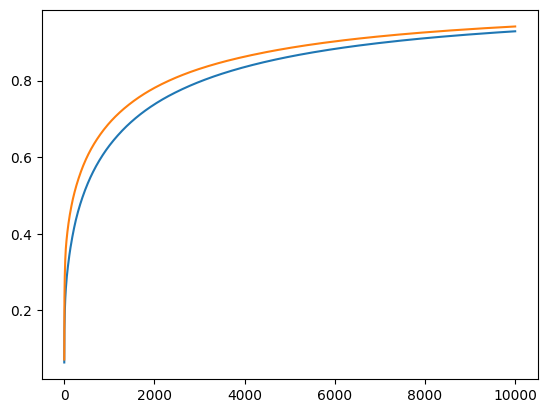

In [6]:
def get_cumulative_percents(dictionary, max_n):
    counts = (dictionary.most_common_stopwords | dictionary.most_common_words).values()
    total = sum(counts)
    percents = [v / total for v in counts]
    return np.cumsum(np.sort(percents)[:-max_n - 1:-1])

N = 10_000
webster_cumsum = get_cumulative_percents(webster, N)
plt.plot(webster_cumsum)

opted_cumsum = get_cumulative_percents(opted, N)
plt.plot(opted_cumsum)

### Gathering data on the OANC

In [108]:
from collections import Counter
from nltk import pos_tag, word_tokenize

word_pattern = r"\w[\w']*"
def create_corpus(folder="./data/OANC", N=-1):
    files = glob.glob(f"{folder}/**/*.txt", recursive=True)
    letters = Counter()
    words = Counter()
    tags = Counter()
    for i, file in enumerate(files):
        if i == N: break
        with open(file, errors="ignore", encoding='utf-8') as f:
            s = f.read()

        letters.update(Counter(s.lower()))
        words.update(Counter(re.findall(word_pattern, s.lower())))
        tags.update(Counter([t[1] for t in pos_tag(word_tokenize(s))]))
    return letters, words, tags

In [109]:
if not os.path.isdir("./output/corpus_data"):
    os.mkdir("./output/corpus_data")

In [111]:
def get_corpus_frequencies(*args, **kwargs):
    def write_dict(d, file):
        df = pd.DataFrame.from_dict(d, orient='index', columns=["Count"])
        df.sort_values("Count", inplace=True, ascending=False)
        df.to_csv(file)
        return df
        
    letters, words, tags = create_corpus(*args, **kwargs)
    
    letters = write_dict({k: v for k, v in letters.items() if k in utils.ascii},
                         "./output/corpus_data/letter_frequency.csv")
    words = write_dict(words, "./output/corpus_data/word_frequency.csv")
    tags = write_dict(tags, "./output/corpus_data/part_of_speech_frequency.csv")
    return letters, words, tags

corpus_letters, corpus_words, corpus_tags = get_corpus_frequencies(folder="../final/data/OANC")

### Creating data for Zipf's Law

In [113]:
def create_dataframe_from_dictionary(dictionary):
    data = dictionary.most_common_words | dictionary.most_common_stopwords
    df = pd.DataFrame(columns=["Word", "Frequency"], data=data.items()).set_index("Word").sort_values(by="Frequency", ascending=False)
    return df / dictionary.total_words_all

dfs = create_dataframe_from_dictionary(opted), create_dataframe_from_dictionary(webster)

N = min(map(len, dfs))
frequencies = np.hstack([df.values[:N] for df in dfs])

In [114]:
if not os.path.isdir("./data/zipfs_law"):
    os.mkdir("./data/zipfs_law")

np.save("./data/zipfs_law/frequencies.npy", frequencies)

### Creating graphs for the data above

In [26]:
import scipy.interpolate as interpolate
import scipy.optimize as optimize


def regularize_x_values(x, y, new_x):
    linear_spline = interpolate.InterpolatedUnivariateSpline(x, y, k=1)
    new_y = [linear_spline.integral(new_x[i], t) / (t - new_x[i]) for i, t in enumerate(new_x[1:])]
    return new_y + [2 * new_y[-1] - new_y[-2]]  # reflect the second to last point across the last one

def fit_function_to_y(X_orig, Y_orig, func, k=1000, **kwargs):
    _fit = lambda _x, _y: optimize.curve_fit(func, _x, _y, **kwargs)[0]
    
    X_reg = np.linspace(min(X_orig), max(X_orig), k)
    Y_reg = [regularize_x_values(X_orig, y_i, X_reg) for y_i in Y_orig]
    
    for y_orig, y_reg in zip(Y_orig, Y_reg):
        regular_vals = opt.curve_fit(func, X_reg, y_reg, **kwargs)[0]
        yield (_fit(X_orig, y_orig), _fit(X_reg, y_reg))

In [23]:
freq = np.load("./data/zipfs_law/frequencies.npy")
x = 1 + np.arange(freq.shape[0])

In [24]:
lx, ly = np.log10(x), np.log10(freq).T

In [27]:
linear_function = lambda x, m, b: m * x + b
params = fit_function_to_y(lx, ly, linear_function)

params_default, params_regularized = [], []
for p0, p1 in params:
    params_default.append(p0)
    params_regularized.append(p1)

params_regularized

[array([-1.10867222, -0.84840104]), array([-1.09340142, -0.88079344])]

In [30]:
c = [
    "#6acbcf", # OPTED
    "#1d5014", # Webster
    "#cbddd0", # OANC color
    "#ff0000" # approximation color
]
fig = make_subplots(rows=1, cols=2, subplot_titles = ["Dictionaries", "OANC"], shared_yaxes='all', shared_xaxes='all', horizontal_spacing=0.01)

x1 = np.linspace(lx[0], lx[-1], 50)
y_star = linear_function(lx, *params_regularized[1])
y_s2 = linear_function(lx, *params_regularized[0])
y1 = regularize_x_values(lx, y_star, x1)
y2 = regularize_x_values(lx, y_s2, x1)
fig.add_trace(go.Scatter(x=x1, y=y1, mode='markers', showlegend=False, line=dict(color=c[-1])))
fig.add_trace(go.Scatter(x=lx, y=ly[0], mode='lines', name="OPTED", line=dict(color=c[0])))
fig.add_trace(go.Scatter(x=lx, y=ly[1], mode='lines', name="Webster", line=dict(color=c[1])))

fig.add_trace(go.Scatter(x=x1, y=y2, mode="markers", showlegend=False, line=dict(color=c[-1])), col=2, row=1)
fig.add_trace(go.Scatter(x=lx, y=ly[-1], mode="lines", name="OANC", line=dict(color=c[2])), col=2, row=1)
fig.update_layout(width=1280, height=720, legend=dict(orientation="h"), template="seaborn")

### N-Grams

In [60]:
if not os.path.isdir("./data/ngrams"):
    os.mkdir("./data/ngrams")
if not os.path.isdir("./output/ngrams"):
    os.mkdir("./output/ngrams")

In [48]:
def get_ngrams(start, end):
    ngrams = {name: {} for name in dictionaries.getattr("name")}

    def get_ngrams_helper(n):
        minimum_count = 2
    
        for name, words in dictionaries.getpairs("name", "definitions").items():
            out = {}
            
            for entry in words.values():
                entry = re.findall("\w[\w']+", ' '.join(entry).lower())
                
                for i in range(len(entry) + 1 - n):
                    ngram = " ".join([entry[i + j] for j in range(n)])
                    out[ngram] = out.get(ngram, 0) + 1  # increment the count in 'out'

            ngrams[name][n] = {ngram: count for ngram, count in out.items() if count >= minimum_count}
            
    threads = ThreadManager(get_ngrams_helper, [(n,) for n in range(start, end + 1)], record_values=False, max_running=20)
    threads.run(progress=True)
    return ngrams

start, end = 2, 15
ngrams = utils.conditional_load(f'./data/ngrams/{start}_{end}.ngrams', get_ngrams, args=(start, end),)
ngrams = {k0: {int(k1): v1 for k1, v1 in v0.items()} for k0, v0 in ngrams.items()}

In [ ]:
a, b = 2, 20
T = 5

ngrams_with_more_than_T_count = {}
for dictionary, counter in ngrams.items():
    ngrams_with_more_than_T_count[dictionary] = {}
    for n in range(a, b + 1):
        ngrams_with_more_than_T_count[dictionary][n] = sum(1 for v in counter.get(n, {}).values()
                                                           if v > T)

df = pd.DataFrame.from_dict(ngrams_with_more_than_T_count)
df.to_csv("./output/ngrams_above_threshold.csv")

### Letter Frequency

In [61]:
if not os.path.isdir("./output/letter_data"):
    os.mkdir("./output/letter_data")

In [ ]:
letter_counts = {}
letter_starting_counts = {}
total_ascii = {}

for name, definitions in dictionaries.getpairs("name", "definitions").items():
    letter_counts[name] = out = {letter: 0 for letter in ascii}
    letter_starting_counts[name] = out_s = {letter: 0 for letter in ascii}
    total_ascii[name] = dict(all=0, start=len(definitions))
    
    for word, entries in definitions.items():
        if (char:=word[0].lower()) in ascii:
            out_s[char] += 1
        for letter in word.lower():
            if letter in ascii:
                total_ascii[name]["all"] += 1
                out[letter] += 1
                
        for entry in entries:
            for letter in entry.lower():
                if letter not in ascii:
                    continue
                total_ascii[name]["all"] += 1
                out[letter] += 1

In [ ]:
def letter_data():
    letters = Counter()
    words = Counter()
    tags = Counter()
    for word, entries in definitions.items():
        s = ' '.join(entries)

        letters.update(Counter(s.lower()))
        words.update(Counter(re.findall(word_pattern, s.lower())))
        tags.update(Counter([t[1] for t in pos_tag(word_tokenize(s))]))
    return letters, words, tags